In [1]:
# Clone the Tensorflow Model Garden and installing the object detection packages
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3129, done.
remote: Counting objects: 100% (3129/3129), done.
remote: Compressing objects: 100% (2454/2454), done.
remote: Total 3129 (delta 833), reused 1496 (delta 631), pack-reused 0
Receiving objects: 100% (3129/3129), 33.34 MiB | 27.44 MiB/s, done.
Resolving deltas: 100% (833/833), done.


In [ ]:
# Installing the object detection packages
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

In [3]:
# import library
from PIL import Image
from urllib.request import urlopen
import numpy as np
import tensorflow_hub as hub
from matplotlib import pyplot as plt
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import label_map_util

In [4]:
def img2numpy(img_path):
  # Open the image from its path
  img = Image.open(urlopen(img_path))
  # Convert image to numpy array with shape (H, W, 3)
  image_array = np.array(img)
  # Convert the numppy array to the shape (1, H, W, 3)
  img_numpy= np.expand_dims(image_array,0)  

  return img_numpy

# Display image from its numpy array
def display_img(numpy_array):
  plt.figure(figsize=(24,30))
  plt.imshow(numpy_array)
  plt.show()

Image data shape:  (1, 1406, 2048, 3)


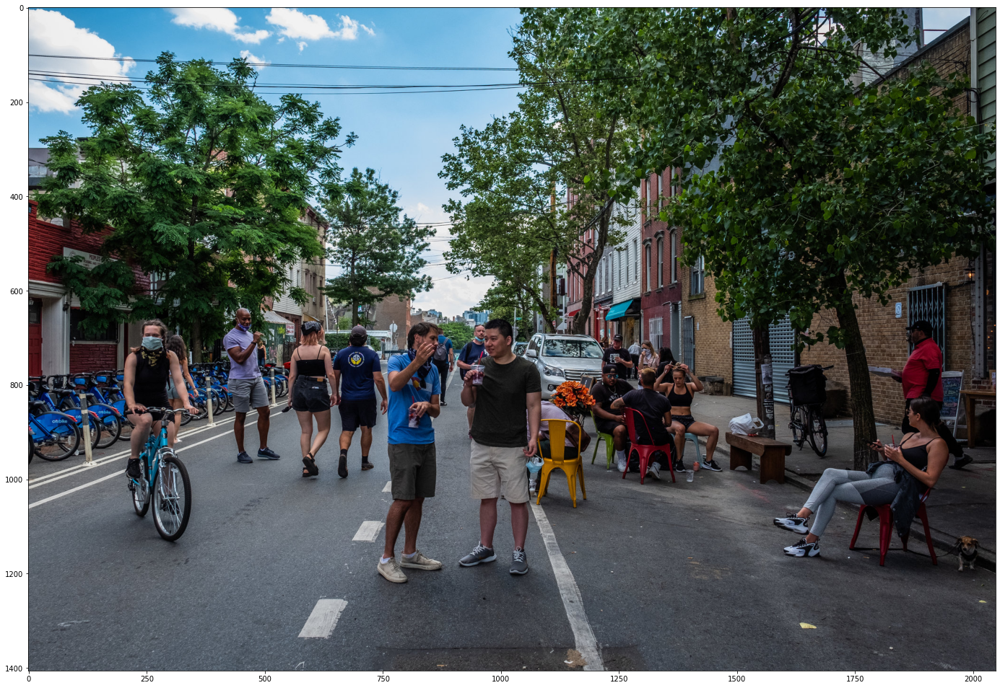

In [8]:
# Using the function to read and display image
%matplotlib inline
img_path= 'https://static01.nyt.com/images/2020/06/22/opinion/20gillisWeb/merlin_173526783_192e498a-5699-411c-b1e5-64fa738eec17-superJumbo.jpg'
img_numpy = img2numpy(img_path)
print('Image data shape: ', img_numpy.shape)
display_img(img_numpy[0])

In [ ]:
# Load object detection model from Tensorflow Hub
object_detector = hub.load("https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1")

In [ ]:
# Using loaded model to detect image
detector_output = object_detector(img_numpy)

In [ ]:
# Example of detector_output
print(detector_output.keys())
print('Detection boxes:', detector_output['detection_boxes'].shape)
print('Detection classes:', detector_output['detection_classes'].shape)
print('Detection scores:', detector_output['detection_scores'].shape)
print('Detection classes:', detector_output['detection_classes'][0].numpy().astype(int))
print('Detection scores:', detector_output['detection_scores'][0].numpy())

dict_keys(['rpn_objectness_predictions_with_background', 'detection_multiclass_scores', 'raw_detection_scores', 'raw_detection_boxes', 'image_shape', 'mask_predictions', 'proposal_boxes', 'detection_boxes', 'rpn_features_to_crop', 'rpn_box_predictor_features', 'final_anchors', 'anchors', 'num_proposals', 'refined_box_encodings', 'detection_scores', 'box_classifier_features', 'detection_masks', 'proposal_boxes_normalized', 'rpn_box_encodings', 'detection_classes', 'detection_anchor_indices', 'num_detections', 'class_predictions_with_background'])
Detection boxes: (1, 100, 4)
Detection classes: (1, 100)
Detection scores: (1, 100)
Detection classes: [ 1  1  1  1  1 28  1 28  1 31  3  1  1  1  1 28  1  3  1  1 31 31  1  3
  1  1  1  3  1  1  1  1  8  1  1  3  1  1  8  1  1  1 28  1 27  3  1  1
 31 31 10  8  1  3  3 27  1  2  1  1  3  1  2  1 38  1  1 41 10  1  1 31
 38 27  1 28 31  6  3  1 27  8  1 28  1  1  6  6  8  3  3  1  1 27  3  1
 28  3  1  1]
Detection scores: [0.9802715  0.9800188

In [6]:
# Map class label name with its id
label_path = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(label_path, use_display_name=True)
print('Category index:', category_index)

Category index: {1: {'id': 1, 'name': 'person'}, 2: {'id': 2, 'name': 'bicycle'}, 3: {'id': 3, 'name': 'car'}, 4: {'id': 4, 'name': 'motorcycle'}, 5: {'id': 5, 'name': 'airplane'}, 6: {'id': 6, 'name': 'bus'}, 7: {'id': 7, 'name': 'train'}, 8: {'id': 8, 'name': 'truck'}, 9: {'id': 9, 'name': 'boat'}, 10: {'id': 10, 'name': 'traffic light'}, 11: {'id': 11, 'name': 'fire hydrant'}, 13: {'id': 13, 'name': 'stop sign'}, 14: {'id': 14, 'name': 'parking meter'}, 15: {'id': 15, 'name': 'bench'}, 16: {'id': 16, 'name': 'bird'}, 17: {'id': 17, 'name': 'cat'}, 18: {'id': 18, 'name': 'dog'}, 19: {'id': 19, 'name': 'horse'}, 20: {'id': 20, 'name': 'sheep'}, 21: {'id': 21, 'name': 'cow'}, 22: {'id': 22, 'name': 'elephant'}, 23: {'id': 23, 'name': 'bear'}, 24: {'id': 24, 'name': 'zebra'}, 25: {'id': 25, 'name': 'giraffe'}, 27: {'id': 27, 'name': 'backpack'}, 28: {'id': 28, 'name': 'umbrella'}, 31: {'id': 31, 'name': 'handbag'}, 32: {'id': 32, 'name': 'tie'}, 33: {'id': 33, 'name': 'suitcase'}, 34: {

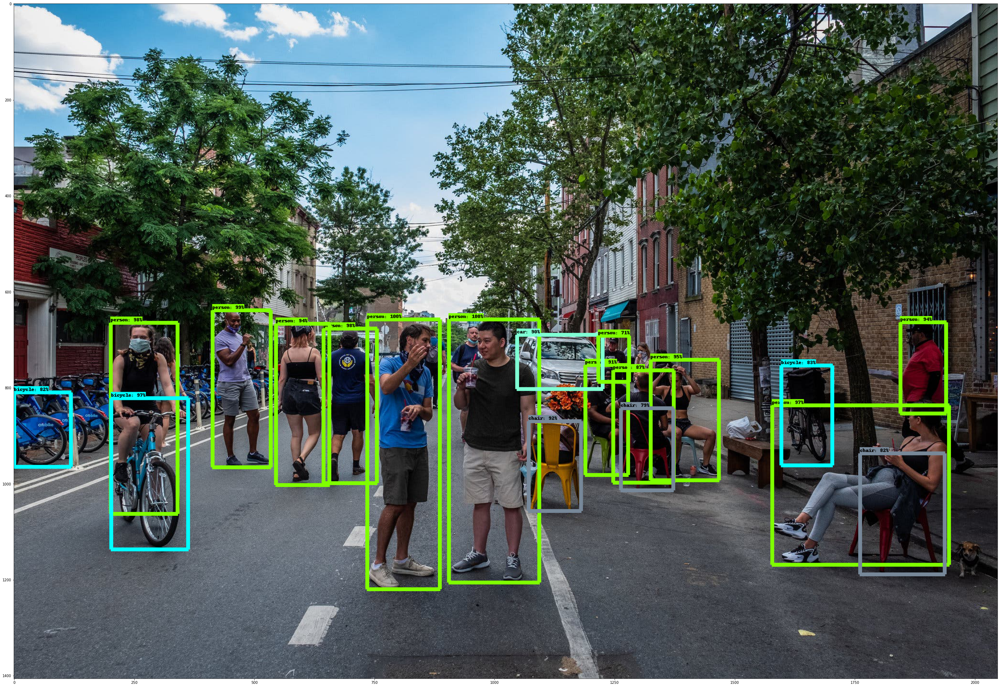

In [ ]:
# overlay bounding boxes and its label on the image
viz_utils.visualize_boxes_and_labels_on_image_array(
      img_numpy[0],
      detector_output['detection_boxes'][0].numpy(),
      detector_output['detection_classes'][0].numpy().astype(int),
      detector_output['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=100,
      min_score_thresh=.70,
      agnostic_mode=False,
      line_thickness=8)

# Display the image
plt.figure(figsize=(50,50))
plt.imshow(img_numpy[0])
plt.show()